# Face and Object Dectection

## OpenCV

### Loading the image

In [29]:
import cv2

In [30]:
#Connect to google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [31]:
#Load image
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people1.jpg')

In [32]:
#Dimension of original image
image.shape

(1280, 1920, 3)

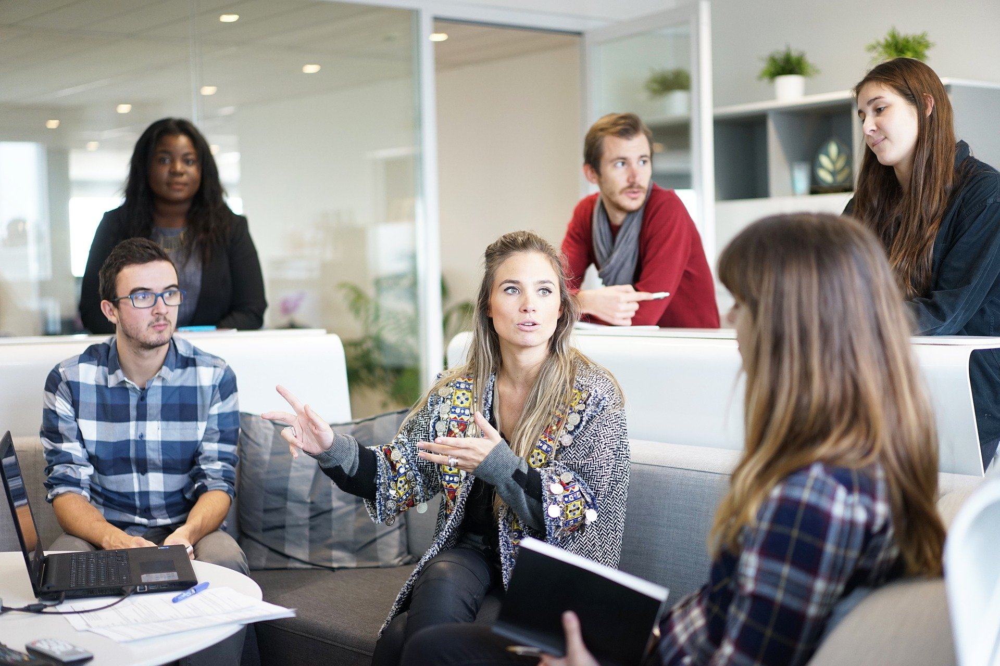

In [33]:
#Display image
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [34]:
#Reduce the size of image
image = cv2.resize(image, (800, 600))

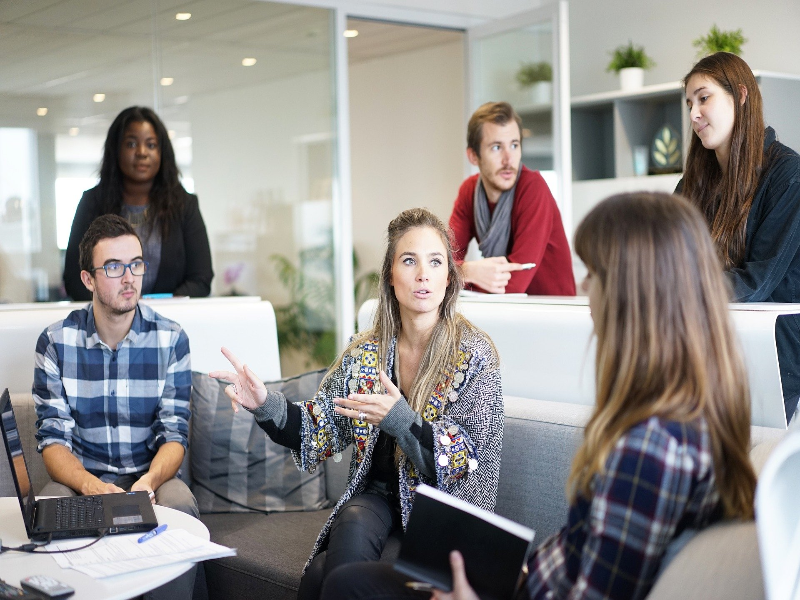

In [35]:
#Display image after resize
cv2_imshow(image)

In [36]:
#Dimension
#color image   #grey image  #Difference of color image and grey image
600*800*3,      600*800   ,  1440000 - 480000   

(1440000, 480000, 960000)

In [37]:
#Convert the color image to grey scale image
image_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

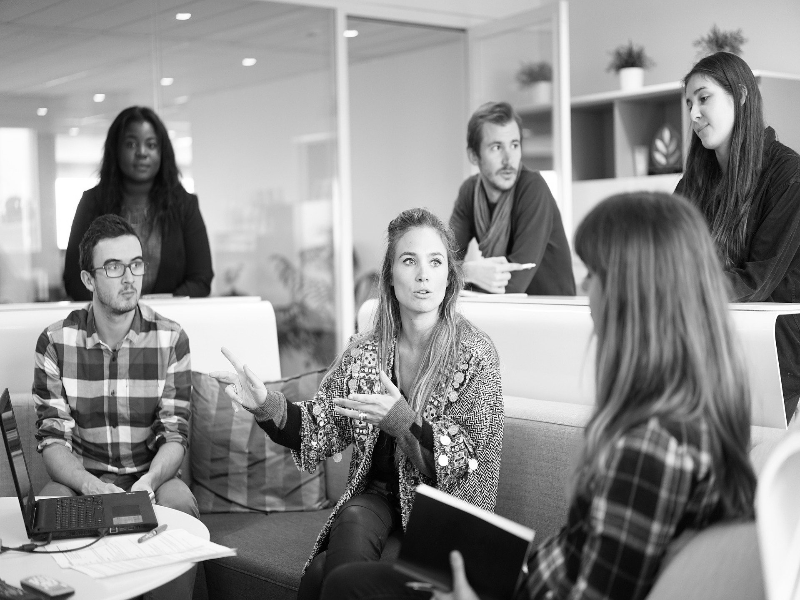

In [38]:
cv2_imshow(image_grey)

In [39]:
#Dimension of color image
image.shape

(600, 800, 3)

In [40]:
#Dimension of grey image
image_grey.shape

(600, 800)

### Detecting faces

In [41]:
#Load the Haarcascade_frontface file
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [42]:
#Detect the face dimension
detections = face_detector.detectMultiScale(image_grey)

In [43]:
print(detections)

[[677  72  68  68]
 [115 124  53  53]
 [475 123  59  59]
 [387 233  73  73]
 [ 92 239  66  66]
 [390 323  56  56]]


In [44]:
#Total count of face detected
len(detections)

6

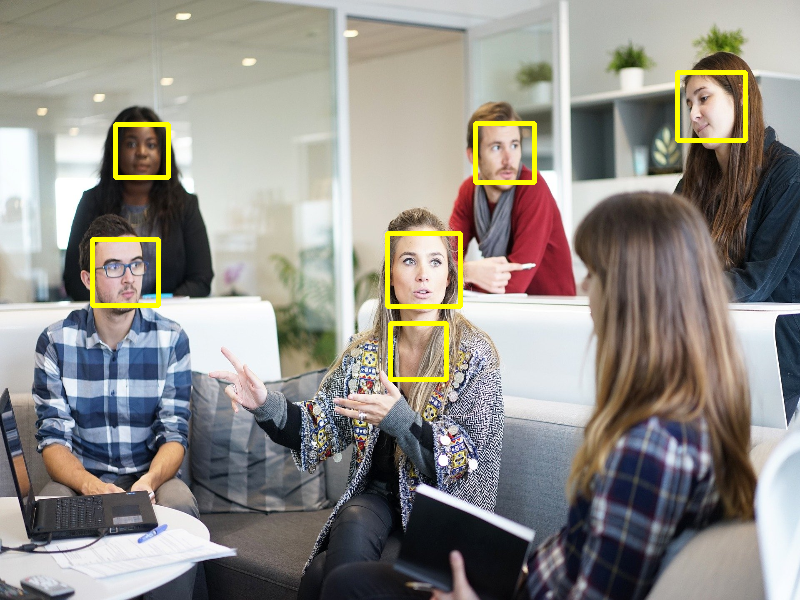

In [45]:
#Make a rectange that detect the face
for x, y, w, h in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 255), 3 )
cv2_imshow(image)

There is a false positive rectangle present in the image. Let's remove those false positive rectangle by adjusting the Scale factor.

### Haarcascade parameters

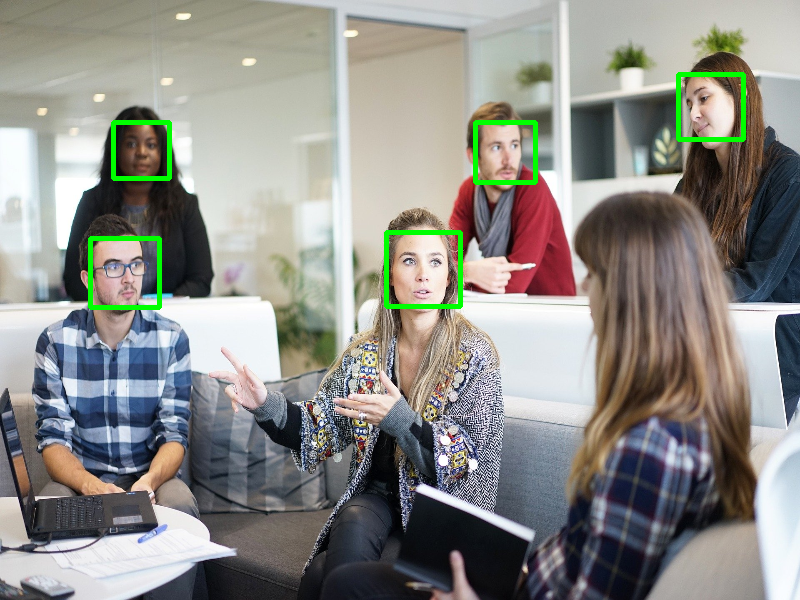

In [46]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people1.jpg')
image = cv2.resize(image, (800,600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x,y), (x + w, y + h), (0, 255, 0), 3)
cv2_imshow(image)

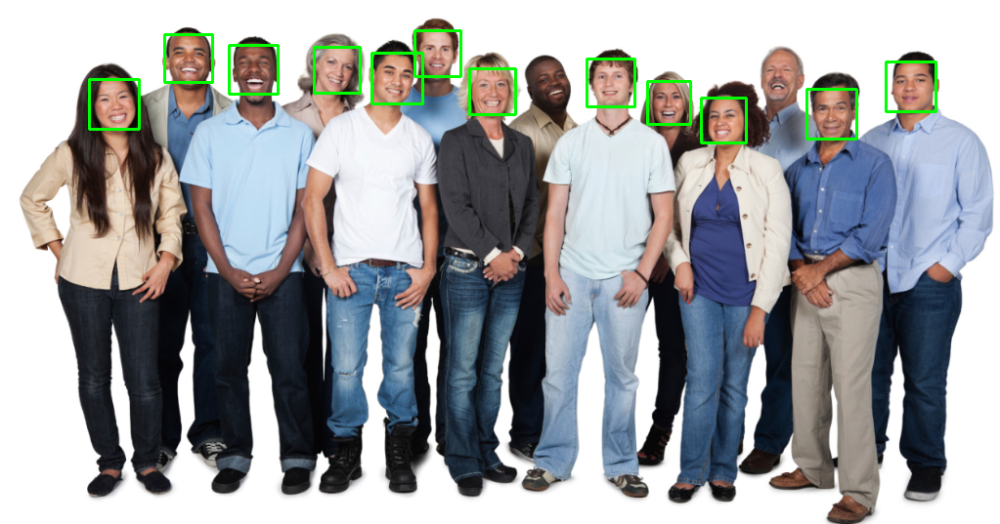

In [47]:
#Loading the second image and detect the face.
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.2, minNeighbors = 7, minSize = (20, 20), maxSize = (100,100))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x,y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(image)

### Eye detection

In [48]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')

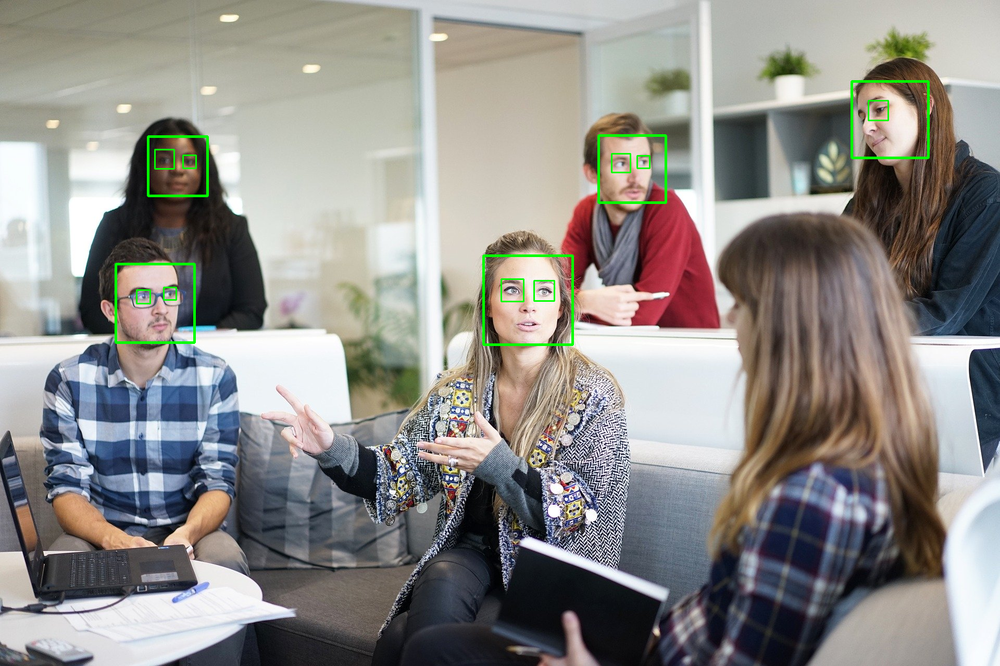

In [50]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people1.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize=(30,30))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x,y), (x + w, y + h), (0, 255, 0), 3)

eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1, minNeighbors = 10, maxSize = (70,70))
for (x, y, w, h) in eye_detections:
  cv2.rectangle(image, (x, y), (x+w,y+h),(0,255,0), 2)
cv2_imshow(image)

### Other objects

#### Cars

In [59]:
cars_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Cascades/cars.xml')

In [60]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/car.jpg')

In [61]:
image.shape

(286, 468, 3)

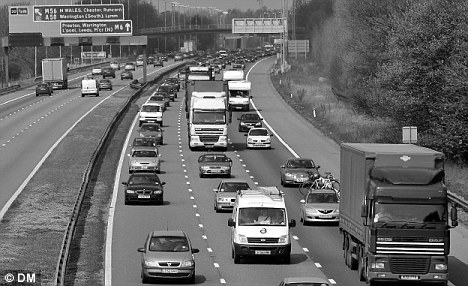

In [62]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

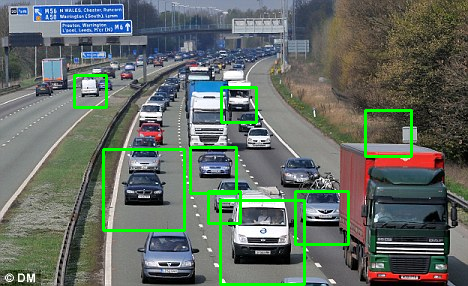

In [63]:
detections = cars_detector.detectMultiScale(image, scaleFactor =1.03, minNeighbors = 5)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (0,255,0),2)
cv2_imshow(image)



#### Clocks

In [77]:
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Cascades/clocks.xml')

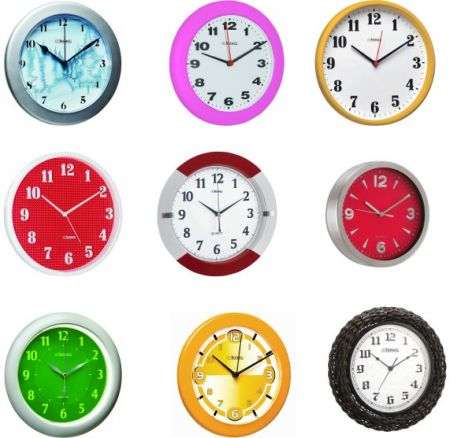

In [78]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/clock.jpg')
cv2_imshow(image)

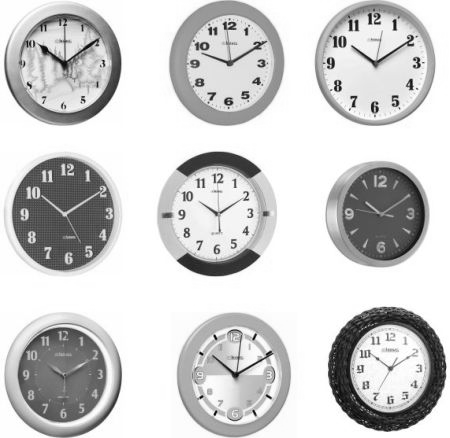

In [79]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

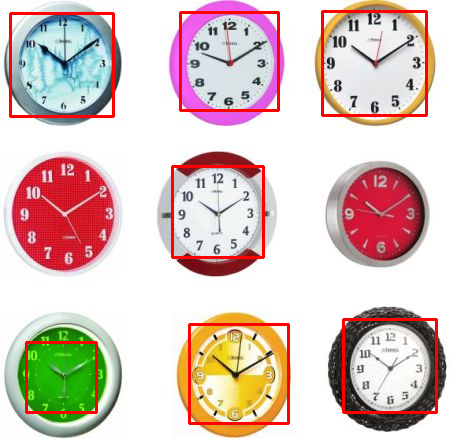

In [80]:
detections = clock_detector.detectMultiScale(image, scaleFactor=1.03, minNeighbors =1)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (0,0,255), 2)
cv2_imshow(image)

#### Full body

In [95]:
fullbody_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Cascades/fullbody.xml')

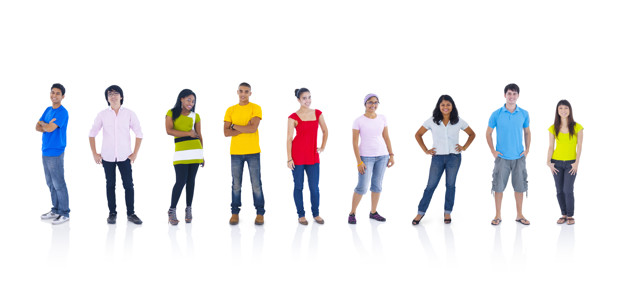

In [96]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people3.jpg')
cv2_imshow(image)

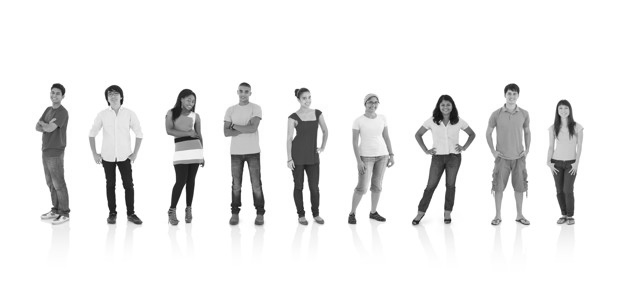

In [97]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

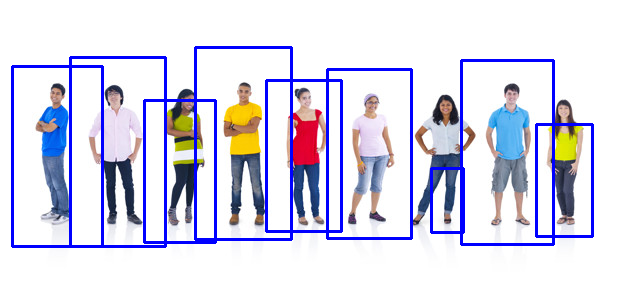

In [98]:
detections = fullbody_detector.detectMultiScale(image, scaleFactor=1.1)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y), (x+w, y+h), (255, 0, 0), 2)
cv2_imshow(image)

## Dlib

# Detecting Faces with HOG

In [99]:
import dlib

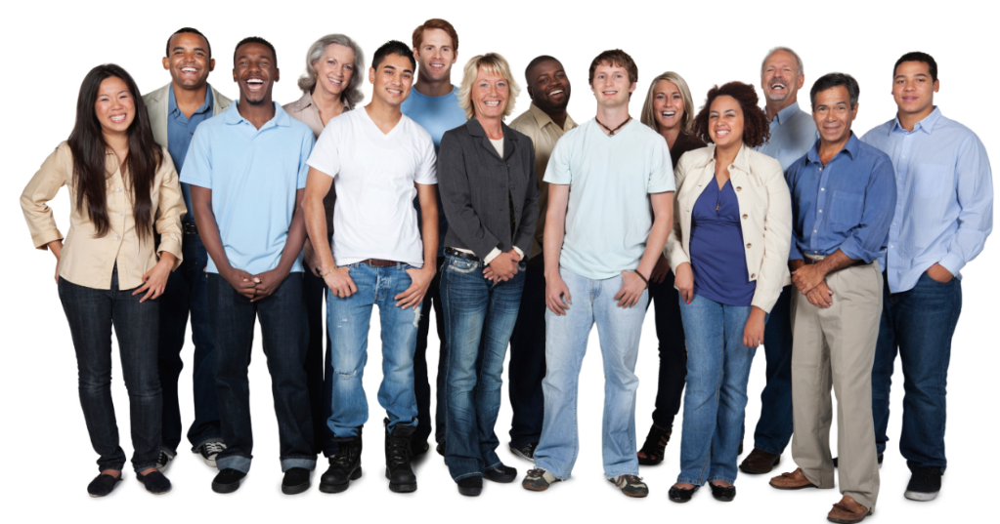

In [100]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people2.jpg')
cv2_imshow(image)

In [101]:
face_detector_hog = dlib.get_frontal_face_detector()

In [102]:
detections = face_detector_hog(image, 1)

In [103]:
detections

rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]]

In [104]:
len(detections)

14

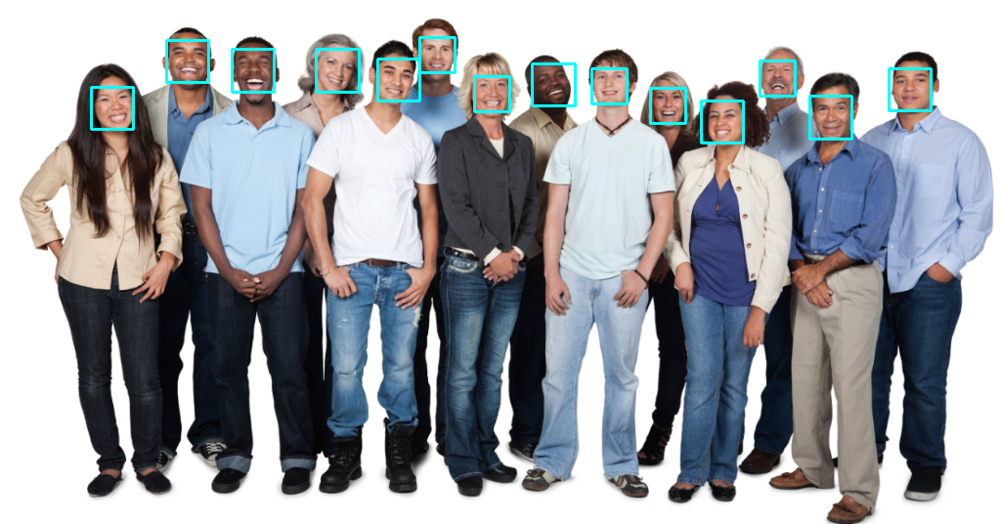

In [107]:
for face in detections:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l,t), (r,b), (255, 255, 0), 2)
cv2_imshow(image)

### Detecting faces with CNN (Convolutional Neural Networks)

In [108]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people2.jpg')


1.1440608501434326
1.137050747871399
1.1278988122940063
1.1200271844863892
1.114937663078308
1.1131559610366821
1.0975686311721802
1.0942121744155884
1.0853146314620972
1.08018958568573
1.0800749063491821
1.0784765481948853
1.0664018392562866
1.064179539680481


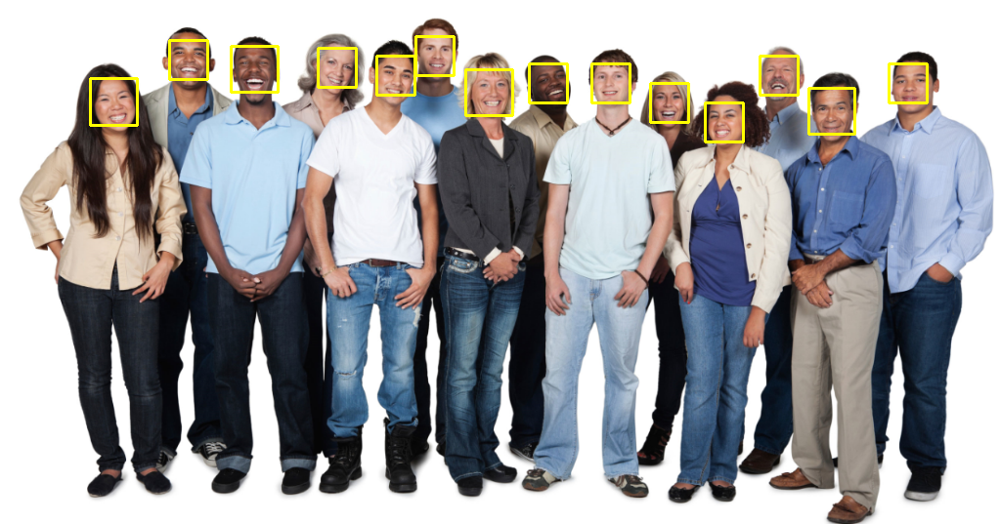

In [109]:
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')
detections = cnn_detector(image, 1)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  print(c)
  cv2.rectangle(image, (l,t), (r,b), (0,255, 255),2)
cv2_imshow(image)

### Haarcascade x HOG x CNN

#### Haarcascade

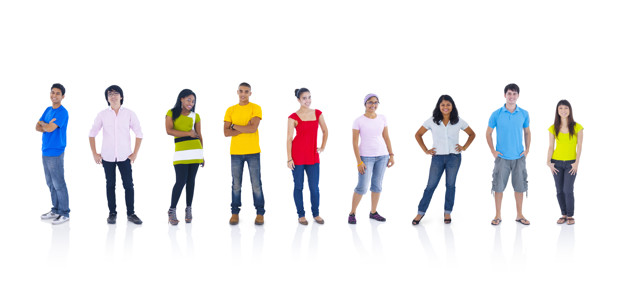

In [117]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people3.jpg')
cv2_imshow(image)

In [118]:
haarcascade_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')


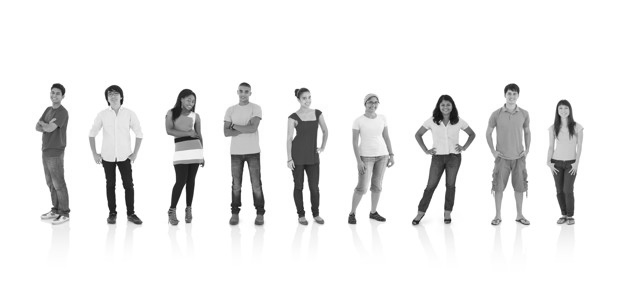

In [119]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

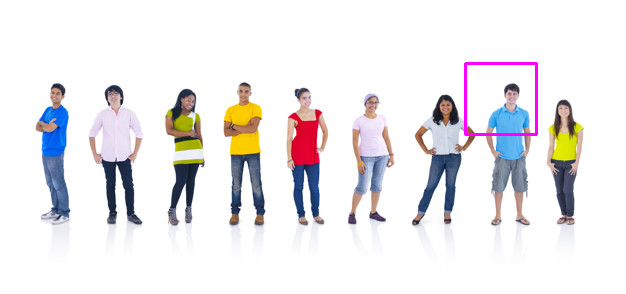

In [120]:
detections = haarcascade_detector.detectMultiScale(image, scaleFactor=1.001, minNeighbors = 5)
for (x,y,w,h) in detections:
  cv2.rectangle(image, (x,y),(x+w, y+h), (255, 0, 255), 2)
cv2_imshow(image)

#### HOG

In [129]:
image =cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people3.jpg')

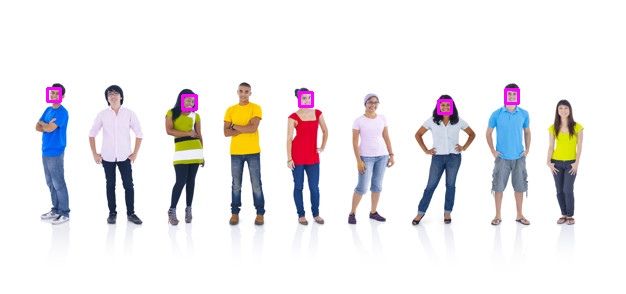

In [130]:

hog_detector = dlib.get_frontal_face_detector()
detections = hog_detector(image, 4)
for face in detections:
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l,t), (r, b), ((255,0,255)), 2)
cv2_imshow(image)

#### CNN

In [131]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Images/people3.jpg')

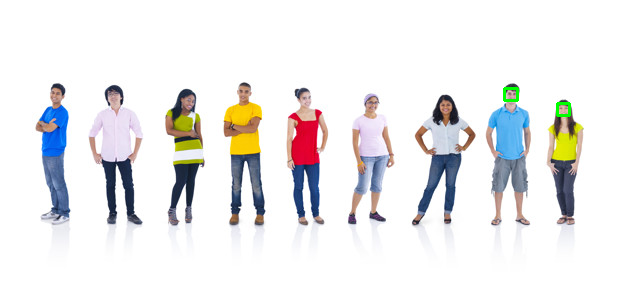

In [134]:
cnn_detector = dlib.cnn_face_detection_model_v1('/content/drive/MyDrive/Computer Vision/Computer Vision Masterclass/Weights/mmod_human_face_detector.dat')
detections = cnn_detector(image, 4)
for face in detections:
  l, t, r, b, c = face.rect.left(), face.rect.top(), face.rect.right(), face.rect.bottom(), face.confidence
  cv2.rectangle(image, (l,t), (r,b), (0,255,0),2)
cv2_imshow(image)

As the faces are very slow in size, HOG performed well in detecting most of the faces as compare to Haarcascade and CNN.